<a href="https://colab.research.google.com/github/Revanth810/AI4CCEE_Fall_2024/blob/main/in_class_activity/Lecture5/submissions/Revanth_Lecture5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lecture 5
## Activity 1

1. Go to : https://github.com/BarkhaM21/AI4CCEE_Fall_2024/tree/main/in_class_activity/Lecture5 and download the file Car_Speed.csv
2. Load data into a new google colab.


In [ ]:
# Step 1: Install necessary libraries
!pip install gdown

# Step 2: Import required libraries
import pandas as pd
import gdown

# Step 3: Define the file ID and download path
file_id = '14FJrR53APD4Xafc7x-NoSDZYhiCXuVra'  # Extracted from the shared link
download_url = f'https://drive.google.com/uc?id={file_id}'
output_file = 'Car_Speed.csv'

# Step 4: Download the CSV file
gdown.download(download_url, output_file, quiet=False)

# Step 5: Load the CSV into a DataFrame
df = pd.read_csv(output_file)

# Step 6: Display the DataFrame
print(df.head())


Downloading...
From: https://drive.google.com/uc?id=14FJrR53APD4Xafc7x-NoSDZYhiCXuVra
To: /content/Car_Speed.csv
100%|██████████| 11.3M/11.3M [00:00<00:00, 89.5MB/s]


   day                 Time  WAVE-NE-Count  WAVE-NE-Speed  WAVE-SW-Count  \
0    1  2022-07-10 00:00:00            NaN            NaN            3.0   
1    1  2022-07-10 00:01:00           10.0           62.0            2.0   
2    1  2022-07-10 00:02:00            5.0           63.6            4.0   
3    1  2022-07-10 00:03:00           11.0           58.2            9.0   
4    1  2022-07-10 00:04:00           19.0           60.2           17.0   

   WAVE-SW-Speed  Month  Year  
0           59.5     10  2021  
1           59.0     10  2021  
2           58.4     10  2021  
3           60.0     10  2021  
4           61.2     10  2021  


3. Plot the data points on a scatter plot (time vs. speed). Any visible trends? (Answer: No)

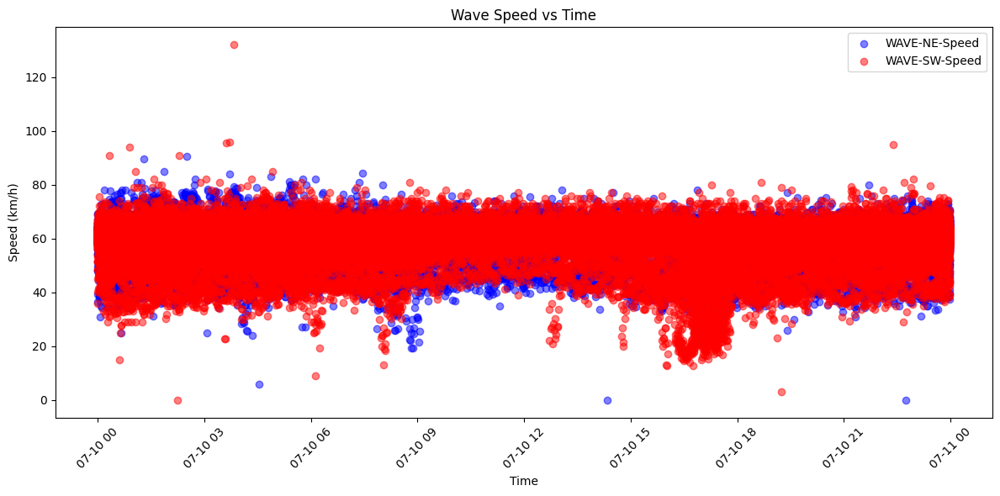

In [ ]:
# Import required libraries
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Load the data (Assuming `df` is already defined)
# If not, uncomment the following line:
# df = pd.read_csv('your_file.csv')

# Step 2: Convert 'Time' column to datetime
df['Time'] = pd.to_datetime(df['Time'])

# Step 3: Plot WAVE-NE-Speed vs Time
plt.figure(figsize=(12, 6))
plt.scatter(df['Time'], df['WAVE-NE-Speed'], color='blue', alpha=0.5, label='WAVE-NE-Speed')
plt.scatter(df['Time'], df['WAVE-SW-Speed'], color='red', alpha=0.5, label='WAVE-SW-Speed')

# Step 4: Add labels and title
plt.xlabel('Time')
plt.ylabel('Speed (km/h)')
plt.title('Wave Speed vs Time')
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Step 5: Display the plot
plt.tight_layout()
plt.show()


4. Split the dataset into training and testing sets.
5. Train a simple linear regression model using Python (scikit-learn).
6. Use the testing data to evaluate the model’s performance.
7. Calculate metrics like Mean Absolute Error (MAE) or Root Mean Squared Error (RMSE).


Linear Regression MSE: 90.22135929107095
Linear Regression RMSE: 9.498492474654647
Linear Regression MAE: 3.9527093980180066
       Actual  Predicted
39792    62.0  60.462603
92992    60.6  60.301084
71051    65.0  60.528065
51273    59.4  60.521542
86831    58.8  60.575531


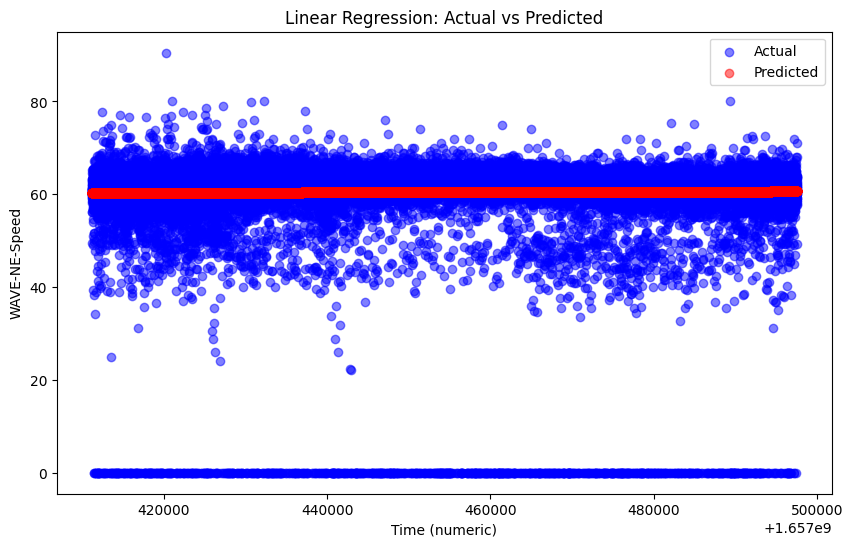

In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Step 2: Load the dataset (assuming `df` is already loaded)
# If not, uncomment the following line to load it:
# df = pd.read_csv('your_file.csv')

# Step 3: Prepare data for regression
df['Time'] = pd.to_datetime(df['Time'])  # Ensure 'Time' is in datetime format
X = df[['Time']].apply(lambda x: x.astype(int) // 10**9)  # Convert datetime to numeric
y = df['WAVE-NE-Speed'].fillna(0)  # Fill NaN values with 0 for simplicity

# Step 4: Split the data (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: Train a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Step 6: Make predictions using Linear Regression
y_pred_linear = linear_model.predict(X_test)

# Step 7: Evaluate the Linear Regression model
mse_linear = mean_squared_error(y_test, y_pred_linear)
rmse_linear = np.sqrt(mse_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)

print(f'Linear Regression MSE: {mse_linear}')
print(f'Linear Regression RMSE: {rmse_linear}')
print(f'Linear Regression MAE: {mae_linear}')

# Step 8: Display actual vs predicted values
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_linear})
print(results.head())

# Step 9: Plot predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_test, color='blue', label='Actual', alpha=0.5)
plt.scatter(X_test, y_pred_linear, color='red', label='Predicted', alpha=0.5)
plt.xlabel('Time (numeric)')
plt.ylabel('WAVE-NE-Speed')
plt.title('Linear Regression: Actual vs Predicted')
plt.legend()
plt.show()


**Result:** The linear regression model yielded an MSE of 90.22, RMSE of 9.5, and MAE of 3.95, indicating that while the model has some predictive power, it still exhibits significant error, with predictions being off by an average of 9.5 units. The higher RMSE compared to MAE suggests occasional large prediction errors. Improvements could be made by adding more relevant features, handling missing values more effectively, or exploring non-linear models if the data contains complex patterns. While the model may be sufficient depending on the variability of wave speeds, further refinements could enhance accuracy, especially if small errors are critical.

# Activity 2 : Clustering Car Speed vs. Time

1. Use KMeans clustering to group data points into clusters.
2. Visualize the clusters on the scatter plot.

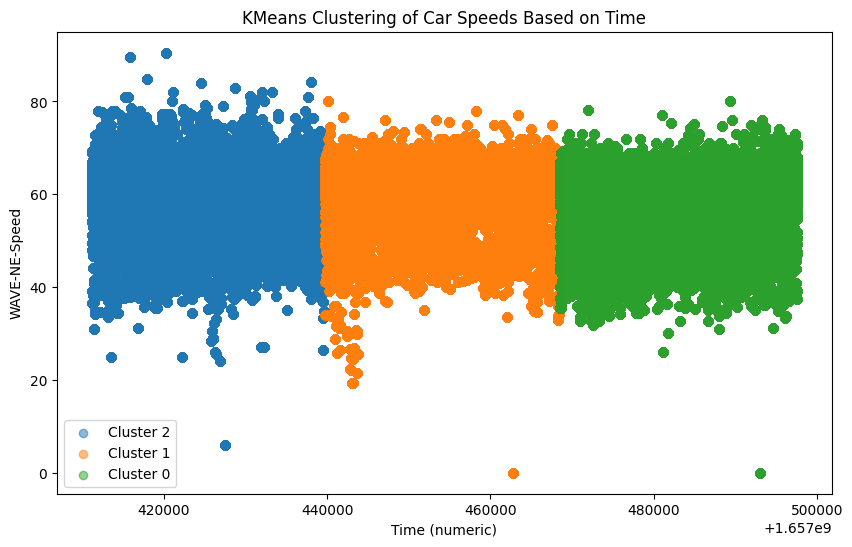

In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 2: Load the dataset (assuming 'df' is already loaded)
# If not, uncomment the next line:
# df = pd.read_csv('your_file.csv')

# Step 3: Prepare the data for clustering
df['Time'] = pd.to_datetime(df['Time'])  # Ensure 'Time' is in datetime format
df['Time_numeric'] = df['Time'].apply(lambda x: x.timestamp())  # Convert time to numeric

# Use 'Time_numeric' and 'WAVE-NE-Speed' for clustering
X = df[['Time_numeric', 'WAVE-NE-Speed']].dropna()  # Drop rows with NaN values

# Step 4: Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # 3 clusters as an example
X['Cluster'] = kmeans.fit_predict(X)

# Step 5: Merge cluster labels back to the original DataFrame
df = df.merge(X[['Time_numeric', 'Cluster']], on='Time_numeric', how='left')

# Step 6: Visualize the clusters
plt.figure(figsize=(10, 6))
for cluster in df['Cluster'].dropna().unique():
    cluster_data = df[df['Cluster'] == cluster]
    plt.scatter(
        cluster_data['Time_numeric'],
        cluster_data['WAVE-NE-Speed'],
        label=f'Cluster {int(cluster)}', alpha=0.5
    )

plt.xlabel('Time (numeric)')
plt.ylabel('WAVE-NE-Speed')
plt.title('KMeans Clustering of Car Speeds Based on Time')
plt.legend()
plt.show()


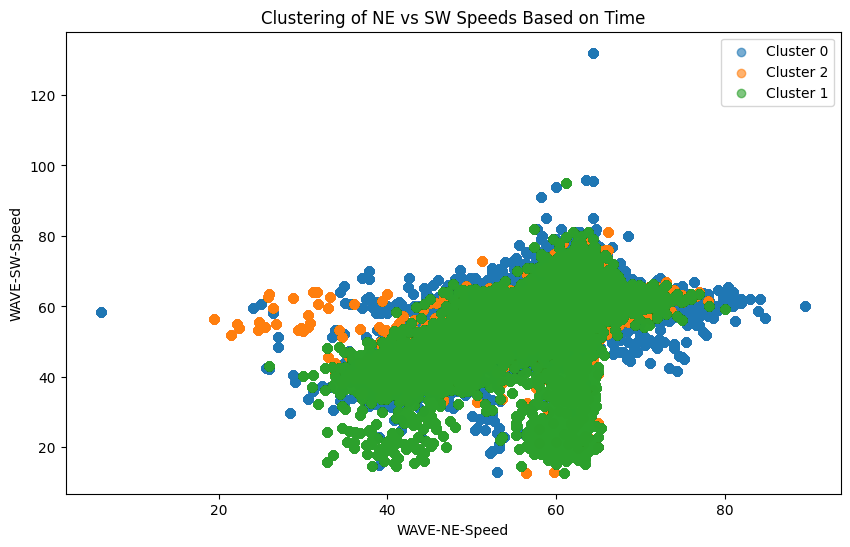

In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 2: Load the dataset (assuming 'df' is already loaded)
# If not, uncomment the next line:
# df = pd.read_csv('your_file.csv')

# Step 3: Prepare the data for clustering
df['Time'] = pd.to_datetime(df['Time'])  # Ensure 'Time' is in datetime format
df['Time_numeric'] = df['Time'].apply(lambda x: x.timestamp())  # Convert time to numeric

# Step 4: Drop rows with missing values in NE or SW speed
df_clean = df[['Time_numeric', 'WAVE-NE-Speed', 'WAVE-SW-Speed']].dropna()

# Step 5: Apply KMeans clustering based on 'Time_numeric'
kmeans = KMeans(n_clusters=3, random_state=42)  # You can adjust the number of clusters
df_clean['Cluster'] = kmeans.fit_predict(df_clean[['Time_numeric']])

# Step 6: Visualize the clusters on a scatter plot (NE vs SW speeds)
plt.figure(figsize=(10, 6))
for cluster in df_clean['Cluster'].unique():
    cluster_data = df_clean[df_clean['Cluster'] == cluster]
    plt.scatter(
        cluster_data['WAVE-NE-Speed'],
        cluster_data['WAVE-SW-Speed'],
        label=f'Cluster {cluster}', alpha=0.6
    )

# Step 7: Add labels, title, and legend
plt.xlabel('WAVE-NE-Speed')
plt.ylabel('WAVE-SW-Speed')
plt.title('Clustering of NE vs SW Speeds Based on Time')
plt.legend()
plt.show()


In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import plotly.express as px

# Step 2: Load the dataset (assuming 'df' is already loaded)
# If not, uncomment the next line:
# df = pd.read_csv('your_file.csv')

# Step 3: Prepare the data for clustering
df['Time'] = pd.to_datetime(df['Time'])  # Ensure 'Time' is in datetime format
df['Time_numeric'] = df['Time'].apply(lambda x: x.timestamp())  # Convert time to numeric

# Step 4: Drop rows with missing values in NE or SW speed
df_clean = df[['Time_numeric', 'WAVE-NE-Speed', 'WAVE-SW-Speed']].dropna()

# Step 5: Apply KMeans clustering based on 'Time_numeric'
kmeans = KMeans(n_clusters=3, random_state=42)  # Adjust n_clusters as needed
df_clean['Cluster'] = kmeans.fit_predict(df_clean[['Time_numeric']])

# Step 6: Create a 3D scatter plot using Plotly
fig = px.scatter_3d(
    df_clean,
    x='WAVE-NE-Speed',
    y='WAVE-SW-Speed',
    z='Time_numeric',
    color='Cluster',  # Color by cluster
    title='3D Scatter Plot of NE vs SW Speeds with Time-Based Clustering',
    labels={'WAVE-NE-Speed': 'NE Speed', 'WAVE-SW-Speed': 'SW Speed', 'Time_numeric': 'Time (Numeric)'},
)

# Step 7: Show the 3D scatter plot
fig.show()


The clustering is done based on time scales. The difference in SW and NE speeds are less in cluster 1 and 2 while their difference is much spread out in cluster 0.

**4.** Explore other clustering algorithms (e.g., DBSCAN, hierarchical clustering).

As the current data contains continuous numeric features (speeds) and likely has irregular traffic patterns with potential outliers (e.g., extreme speeds), DBSCAN is a better option in comparison with hierarchical clustering as DBSCAN can handle clusters with irregular shapes and outliers.
KMeans might struggle if clusters are not spherical or if there are noise points.
Hierarchical clustering can be computationally expensive if the dataset is large.

In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
import plotly.express as px

# Step 2: Load the dataset (assuming 'df' is already loaded)
# If not, uncomment the next line:
# df = pd.read_csv('your_file.csv')

# Step 3: Prepare the data
df['Time'] = pd.to_datetime(df['Time'])  # Ensure 'Time' is in datetime format
df['Time_numeric'] = df['Time'].apply(lambda x: x.timestamp())  # Convert time to numeric

# Use 'Time_numeric', 'WAVE-NE-Speed', and 'WAVE-SW-Speed' for clustering
X = df[['Time_numeric', 'WAVE-NE-Speed', 'WAVE-SW-Speed']].dropna()

# Step 4: Apply DBSCAN
dbscan = DBSCAN(eps=500, min_samples=10)  # Adjust eps based on data
X['Cluster'] = dbscan.fit_predict(X)

# Step 5: Visualize the clusters using Plotly (3D Scatter Plot)
fig = px.scatter_3d(
    X,
    x='WAVE-NE-Speed',
    y='WAVE-SW-Speed',
    z='Time_numeric',
    color='Cluster',  # Color by cluster
    title='DBSCAN Clustering of NE vs SW Speeds with Time',
    labels={'WAVE-NE-Speed': 'NE Speed', 'WAVE-SW-Speed': 'SW Speed', 'Time_numeric': 'Time (Numeric)'},
)

# Step 6: Show the 3D scatter plot
fig.show()


What are the pros and cons of DBSCAN compared to K-means and hierarchical clustering? In what scenarios would each clustering technique be most appropriate?

Answer:

Comparison of DBSCAN, K-Means, and Hierarchical Clustering:

## 1. DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

**Pros:**

* Can detect clusters of arbitrary shapes (non-spherical).

* Identifies noise/outliers effectively by assigning them to a special label (-1).
*No need to specify the number of clusters in advance (like in K-Means).

**Cons:**

* Parameter tuning (especially eps and min_samples) can be challenging.
* Sensitive to data scaling—features need to be standardized for meaningful results.
* Not suitable for high-dimensional data or very large datasets.

**Best Use Case:**
DBSCAN is ideal for datasets with irregularly shaped clusters and noise (e.g., geographic data, spatial patterns, traffic data with outliers).

## 2. K-Means Clustering

**Pros:**

* Simple and fast, especially for large datasets.
* Works well with spherical, evenly distributed clusters.
* Easy to implement and widely used for a variety of clustering problems.

**Cons:**

* Requires pre-specifying the number of clusters (k).
Sensitive to outliers—even a few outliers can distort cluster centers.
* Works best with clusters of similar sizes and density; struggles with irregular shapes.

**Best Use Case:**
K-Means is suitable for structured data with well-separated clusters of similar density (e.g., customer segmentation, image compression).

## 3. Hierarchical Clustering (Agglomerative/Divisive)

**Pros:**

* Does not require pre-specifying the number of clusters.
Can provide a dendrogram (tree structure) to visualize cluster relationships.
* Useful for nested clusters or hierarchical relationships in data.

**Cons:**

* Computationally expensive for large datasets (O(n²) or worse).
* Sensitive to noise and outliers.
* The choice of distance metric and linkage method impacts the clustering result.

**Best Use Case:**
Hierarchical clustering works well for small datasets with hierarchical relationships (e.g., taxonomy, gene sequencing, social networks).

# Activity 3: Understanding and Applying Random Forest for Crash Data Analysis.

1.	Download and load file 'crash_data.csv' into your Google Colab notebook from class git repository.
2.	Use pandas to load the CSV data.
3.	Display the first few rows of the dataset using df.head().

In [16]:
# Step 1: Install gdown if it's not already installed
!pip install gdown

# Step 2: Import necessary libraries
import pandas as pd

# Step 3: Download the file from Google Drive using gdown
!gdown --id 1EoiiAnouAgr0knLS5cz1jckYmC892X5j --output crash_data.csv

# Step 4: Load the CSV data into a pandas DataFrame
df = pd.read_csv('crash_data.csv')

# Step 5: Display the first few rows of the dataset
df.head()

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1EoiiAnouAgr0knLS5cz1jckYmC892X5j
To: /content/drive/MyDrive/crash_data.csv
100% 72.3M/72.3M [00:00<00:00, 137MB/s]


<ipython-input-16-0b688e9b38f9>:11: DtypeWarning:

Columns (5,27,68,94,102,104,106,108,114,116,118,136,138,200,201,202,203,217,219,221,223,225,234,236,238,240,242,244,246,248,250,252) have mixed types. Specify dtype option on import or set low_memory=False.



,STATE,STATENAME,ST_CASE,VEH_NO_x,DAMAGE,DAMAGENAME,PEDS,PERNOTMVIT,VE_TOTAL,VE_FORMS_x,...,DRUGRES3,DRUGRES3NAME,P_SF1,P_SF1NAME,P_SF2,P_SF2NAME,P_SF3,P_SF3NAME,RACE,RACENAME
0,19,Iowa,190001,1,11.0,11 Clock Value,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,19,Iowa,190001,1,11.0,11 Clock Value,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,19,Iowa,190001,1,11.0,11 Clock Value,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,19,Iowa,190001,1,11.0,11 Clock Value,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,19,Iowa,190001,1,13.0,Top,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


4.	Check for missing values and data types using df.info().

In [17]:
# Step 6: Check for missing values and data types
print("\nDataset info (missing values and data types):")
df.info()


Dataset info (missing values and data types):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36281 entries, 0 to 36280
Columns: 253 entries, STATE to RACENAME
dtypes: float64(44), int64(94), object(115)
memory usage: 70.0+ MB


5.	Create summary statistics using df.describe().

In [20]:
# Step 7: Create summary statistics for numerical columns
print("\nSummary statistics:")
df.describe()


Summary statistics:


,STATE,ST_CASE,VEH_NO_x,DAMAGE,PEDS,PERNOTMVIT,VE_TOTAL,VE_FORMS_x,PVH_INVL,PERSONS,...,DRUGTST1,DRUGTST2,DRUGTST3,DRUGRES1,DRUGRES2,DRUGRES3,P_SF1,P_SF2,P_SF3,RACE
count,36281.0,36281.000000,36281.000000,18617.000000,36281.000000,36281.000000,36281.000000,36281.000000,36281.000000,36281.000000,...,4192.000000,4192.000000,4192.000000,4192.000000,4192.000000,4192.000000,17664.000000,17664.000000,17664.000000,10586.000000
mean,19.0,190121.561561,3.020203,9.509481,0.044486,0.052810,4.772526,4.617293,0.155233,6.224222,...,0.737118,0.034828,0.005725,60.093511,19.769561,3.926765,0.052819,0.033628,0.033628,1.233422
std,0.0,100.474264,2.939280,8.353906,0.257104,0.283252,4.170953,3.960148,0.384646,4.647696,...,1.679547,0.200759,0.081536,172.351104,120.995603,55.768586,2.120843,1.824336,1.824336,8.826797
min,19.0,190001.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.0,190019.000000,1.000000,6.000000,0.000000,0.000000,2.000000,2.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,19.0,190098.000000,2.000000,11.000000,0.000000,0.000000,2.000000,2.000000,0.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,19.0,190208.000000,3.000000,12.000000,0.000000,0.000000,10.000000,10.000000,0.000000,11.000000,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,19.0,190333.000000,12.000000,99.000000,4.000000,4.000000,12.000000,11.000000,4.000000,16.000000,...,9.000000,2.000000,2.000000,999.000000,996.000000,996.000000,99.000000,99.000000,99.000000,99.000000


6.	Identify the target variable = crash severity.
7.	Select relevant features for prediction : Time of day, driver age, vehicle type.
8.	Split the data into features (X) and target variable (y).
9.	Further split the data into training and testing sets (e.g., 80% training, 20% testing).
10.	Import RandomForestClassifier from sklearn.ensemble.
11.	Create a Random Forest model with n_estimators=100.
12.	Fit the model to the training data.
13.	Make Predictions and Evaluate: crashes by age group.
14.	Calculate accuracy score using accuracy_score from sklearn.metrics.
15.	Generate a classification report using classification_report from sklearn.metrics.

In [22]:
# Step 1: Install necessary packages
#!pip install scikit-learn pandas

# Step 2: Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Step 6: Identify the target variable ('crash severity' assumed as DAMAGE)
target_column = 'INJ_SEV'

# Step 7: Select relevant features (Time of day, driver age, vehicle type)
# Assuming column names like 'HOUR_x', 'AGE', 'BODY_TYP', 'INJ_SEV' exist
# Adjust these if different column names are used
relevant_features = ['HOUR_x', 'AGE', 'BODY_TYP', 'INJ_SEV']

# Step 8: Split the data into features (X) and target variable (y)
X = df[relevant_features]
y = df[target_column]

# Step 9: Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 10: Import RandomForestClassifier from sklearn.ensemble
# Already done above

# Step 11: Create a Random Forest model with n_estimators=100
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Step 12: Fit the model to the training data
rf_model.fit(X_train, y_train)

# Step 13: Make predictions on the test data
y_pred = rf_model.predict(X_test)

# Step 14: Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy:.2f}")

# Step 15: Generate a classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy Score: 1.00

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2538
           1       1.00      1.00      1.00       758
           2       1.00      1.00      1.00       705
           3       1.00      1.00      1.00       750
           4       1.00      1.00      1.00      2458
           5       1.00      1.00      1.00        10
           9       1.00      1.00      1.00        38

    accuracy                           1.00      7257
   macro avg       1.00      1.00      1.00      7257
weighted avg       1.00      1.00      1.00      7257

